## Symmetric Chaos

Some mathematical explainations can be found [here](http://www.ams.org/notices/199502/golubitsky.pdf), by Mike Field and Martin Golubitsky.

### Plotting options 

In [1]:
import numpy as np, pandas as pd, datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import inferno, viridis
from numba import jit
import numba
from functools import partial
from datashader.utils import export_image
background = "white"
import sys
ds.transfer_functions.Image.border = 0

For saving figures we use `partial` and `export_image`. 

In [2]:
img_map = partial(export_image, export_path="sym_chaos", background=background)

#### Function definition, this is the python version, and it comes from [François Pacull](https://github.com/djfrancesco/Math_notebooks/blob/master/attractors/golubitsky_01.ipynb). I just changed the name's function, to `symIcon`.

In [3]:
@jit
def symIcon(x, y, alph, bet, gamm, omeg, lambd, deg):
    zzbar = x * x + y * y
    p = alph * zzbar + lambd
    zreal, zimag = x, y
    for i in range(1, deg-1):
        za, zb = zreal * x - zimag * y, zimag * x + zreal * y
        zreal, zimag = za, zb
    zn = x * zreal - y * zimag
    p += bet * zn
    return p * x + gamm * zreal - omeg * y, \
           p * y - gamm * zimag + omeg * x

In [4]:
n = 20000000
@jit
def trajectory(alph, bet, gamm, omeg, lambd, deg, x0=0.01, y0=0.01, n=n):
    x, y = np.zeros(n), np.zeros(n)
    x[0], y[0] = x0, y0
    for i in np.arange(n-1):
        x[i+1], y[i+1] = symIcon(x[i], y[i], alph, bet, gamm, omeg, lambd, deg)
    return pd.DataFrame(dict(x=x,y=y))

#### Colors

In [5]:
wb  = ["white", "black"]

Now, a set of suitable colormaps can be found in `colorcet` as follows.

In [6]:
from colorcet import palette
cmaps =  [palette[p][::-1] for p in ['bgy', 'bmw', 'bgyw', 'bmy','fire', 'gray', 'kbc', 'kgy']]
cmaps += [inferno[::-1], viridis[::-1]]

See http://holoviews.org/user_guide/Colormaps.html for more info. 

In [7]:
def plotIcon(symIcon, alph, bet, gamm, omeg, lambd, deg, x0=0.01, y0=0.01, n=n, cmap=wb):
    df = trajectory(alph, bet, gamm, omeg, lambd, deg)
    cvs = ds.Canvas(plot_width = 600, plot_height = 600)
    agg = cvs.points(df, 'x', 'y')
    img = tf.shade(agg, cmap=cmap, how='linear', span = [0,n/100000])
    return img

In [8]:
cvals = [
    (1.8, 0.0, 1.0, 0.1, -1.93, 5),
    (5.0, -1.0, 1.0, 0.188, -2.5, 5),
    (-1.0, 0.1, -0.82, 0.12, 1.56, 3),
    (1.806, 0.0, 1.0, 0.0, -1.806, 5),
    (10.0, -12.0, 1.0, 0.0, -2.195, 3),
    (-2.5, 0.0, 0.9, 0.0, 2.5, 3),
    (3.0, -16.79, 1.0, 0.0, -2.05, 9),
    (5.0, 1.5, 1.0, 0.0, -2.7, 6),
    (-2.5, 0.0, 0.9, 0.0, 2.409, 23),
    (1.0, -0.1, 0.167, 0.0, -2.08, 7),
    (2.32, 0.0, 0.75, 0.0, -2.32, 5),
    (-2.0, 0.0, -0.5, 0.0, 2.6, 5),
    (2.0, 0.2, 0.1, 0.0, -2.34, 5),
    (2.0, 0.0, 1.0, 0.1, -1.86, 4),
    (-1.0, 0.1, -0.82, 0.0, 1.56, 3),
    (-1.0, 0.1, -0.805, 0.0, 1.5, 3),
    (-1.0, 0.03, -0.8, 0.0, 1.455, 3),
    (-2.5, -0.1, 0.9, -0.15, 2.39, 16)
]

In [9]:
IconSet = [plotIcon(symIcon, *cvals[i], cmap=cmaps[(i+1)%len(cmaps)]) for i in range(len(cvals))]


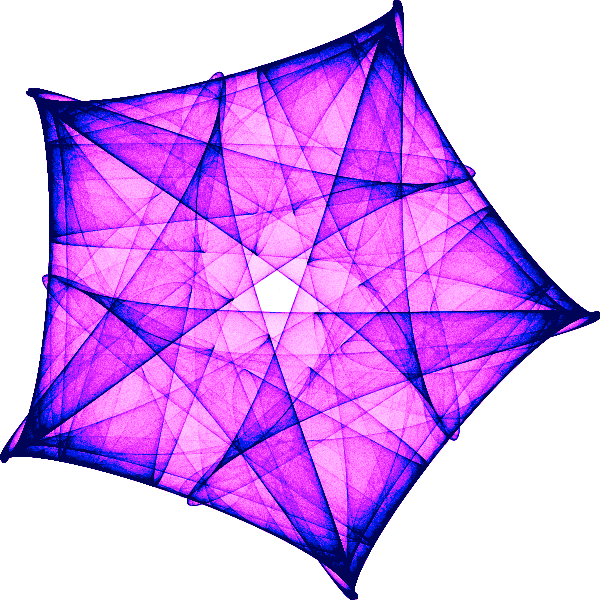
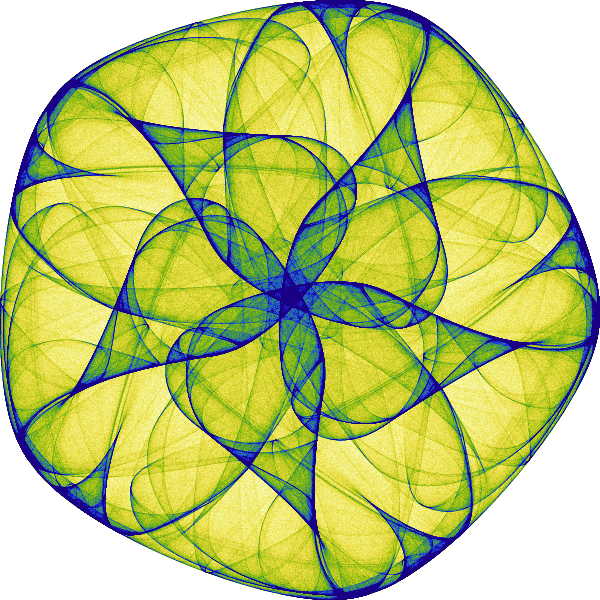
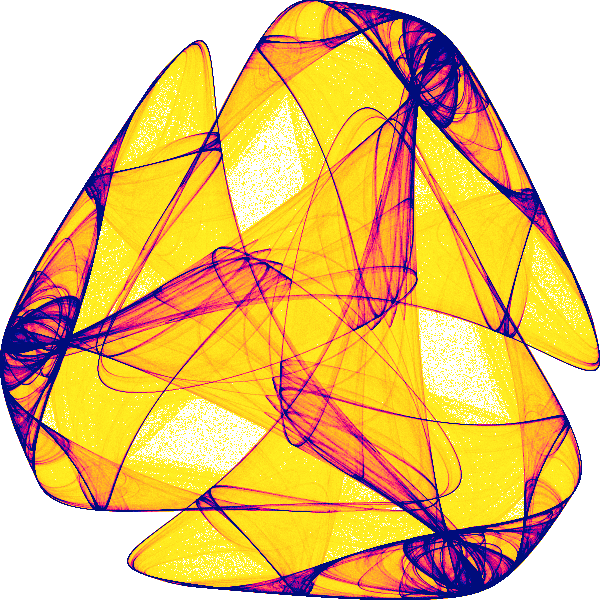
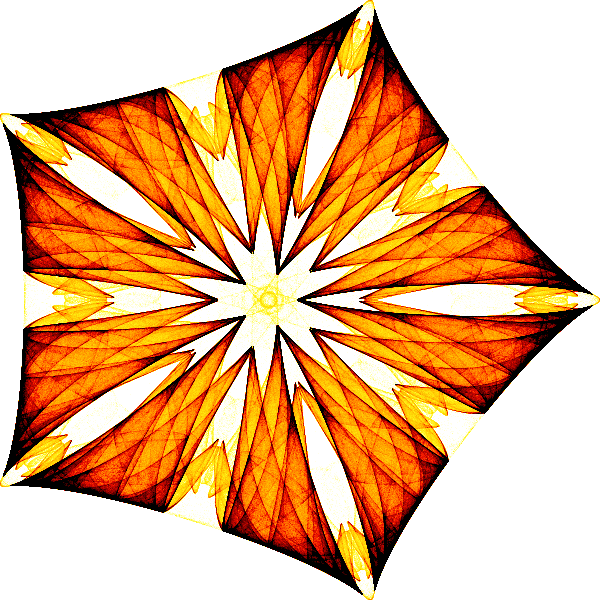
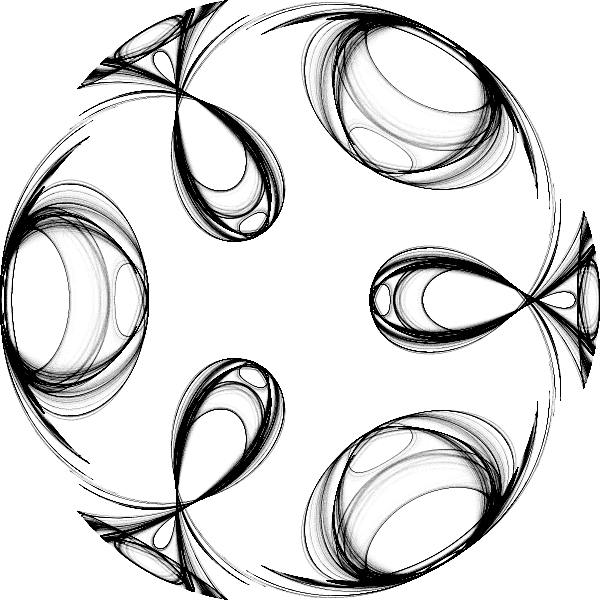
...
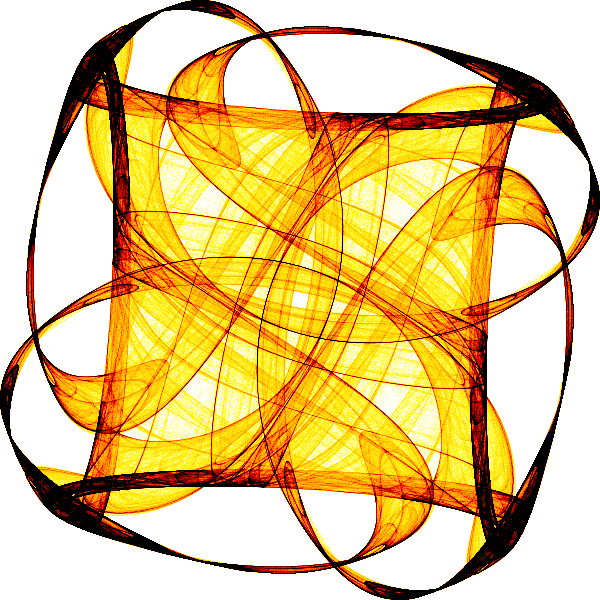
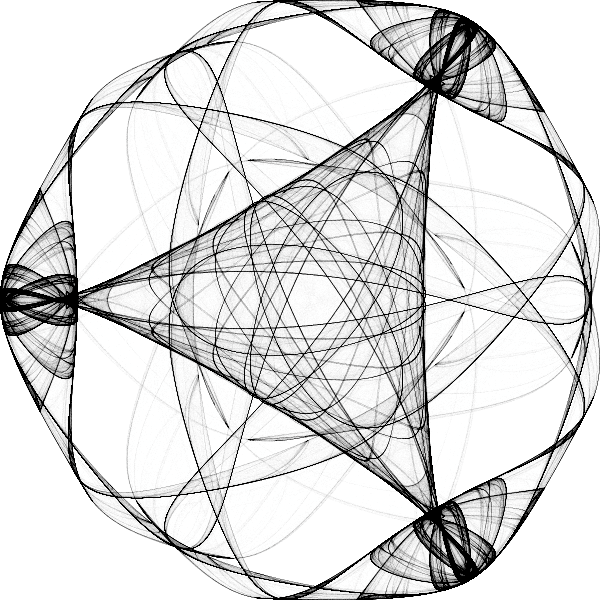
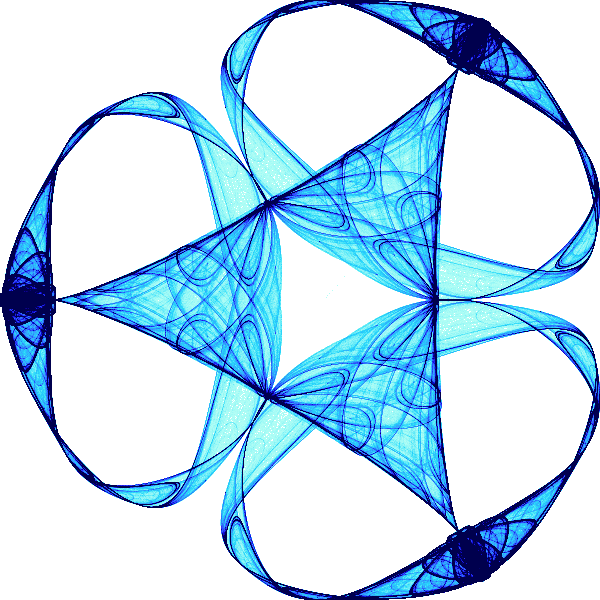
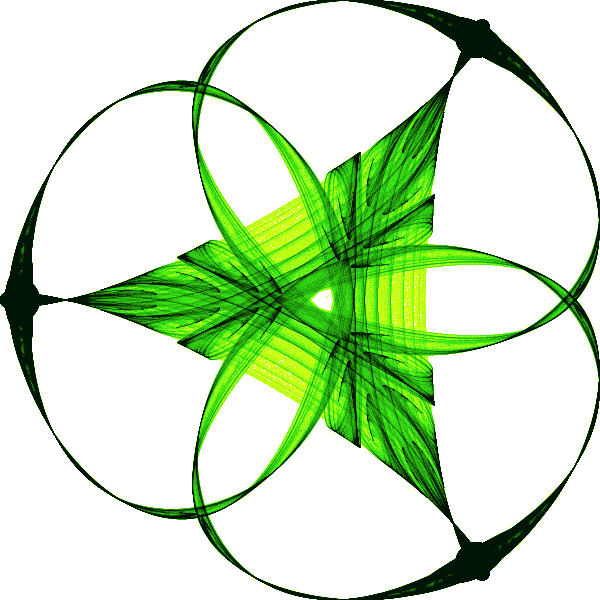
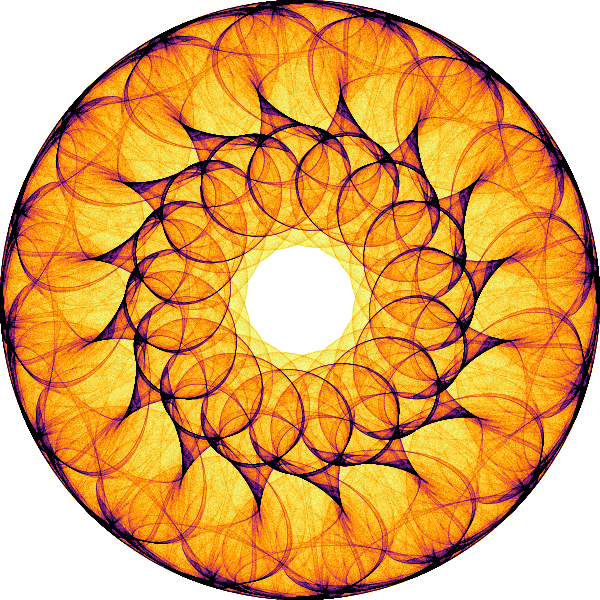

In [10]:
tf.Images(*IconSet).cols(5)

#### Saving each picture...

In [11]:
for indx in range(len(IconSet)):
    img_map(tf.dynspread(IconSet[indx]), "IconSet_u%s"%indx)

### Packages, version control

In [12]:
print(f"Python version: {sys.version}")
print(" ")
print("numpy == ", np.__version__)
print("pandas == ", pd.__version__)
print("datashader == ", ds.__version__)
print("numba == ", numba.__version__)

Python version: 3.6.4 |Anaconda custom (64-bit)| (default, Jan 16 2018, 12:04:33) 
[GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]
 
numpy ==  1.14.0
pandas ==  0.22.0
datashader ==  0.6.5
numba ==  0.36.2
